# Import functions

In [1]:
import lifting
import joint
import load_data
import importlib

importlib.reload(lifting)
importlib.reload(load_data)

<module 'load_data' from '/Users/shrutinath/Documents/WBGT/load_data/__init__.py'>

# Import model data

## Specify models to use

In [2]:
## start with experiments on select models
models = ['UKESM1-0-LL']

## Load in data (using load data package)

In [3]:
## Note: provide dictionary of data for each model containing y, run_nr, T_ref, Tan_wgt_globmean as xarray with 
## coords: scenario, run, time, gp

data_tas = load_data.get_cmip6_data(models)

/Users/shrutinath/.pyenv/versions/tf_2023/lib/python3.12/site-packages/mplotutils/xrcompat.py:13: FutureWarning: It's no longer necessary to compute the edges of the array. This is now done in matplotlib. This function will be removed from mplotutils in a future version.
  warnings.warn(


start with model UKESM1-0-LL


/Users/shrutinath/Documents/WBGT/load_data/extract_cmip6.py:174: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  xr.Dataset(
/Users/shrutinath/Documents/WBGT/load_data/extract_cmip6.py:174: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by convertin

In [4]:
data_rh = load_data.get_cmip6_data(models, var='hurs') 

/Users/shrutinath/.pyenv/versions/tf_2023/lib/python3.12/site-packages/mplotutils/xrcompat.py:13: FutureWarning: It's no longer necessary to compute the edges of the array. This is now done in matplotlib. This function will be removed from mplotutils in a future version.
  warnings.warn(


start with model UKESM1-0-LL


/Users/shrutinath/Documents/WBGT/load_data/extract_cmip6.py:174: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  xr.Dataset(
/Users/shrutinath/Documents/WBGT/load_data/extract_cmip6.py:174: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by convertin

## Visual check of model data

/Users/shrutinath/.pyenv/versions/tf_2023/lib/python3.12/site-packages/mplotutils/xrcompat.py:13: FutureWarning: It's no longer necessary to compute the edges of the array. This is now done in matplotlib. This function will be removed from mplotutils in a future version.
  warnings.warn(


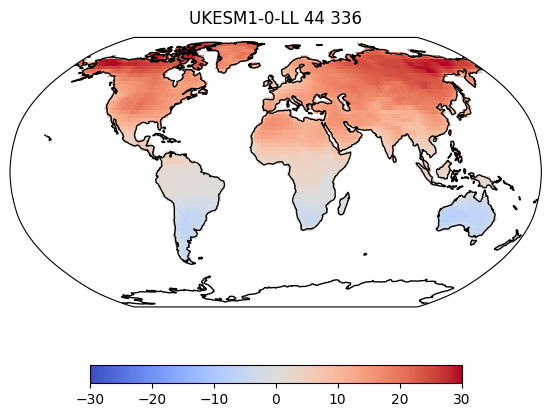

In [5]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import matplotlib.colors as mcolors
import numpy as np
lon_pc, lat_pc, wgt, wgt_l, idx_l = load_data.get_meta_data()
model = 'UKESM1-0-LL'
scen = 'ssp585'
run = 1
timestep = '2050-06-01'

fig1=plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 10})
plt.rcParams.update({'mathtext.default':'regular'}) 
plt.rcParams.update({'mathtext.default':'it'}) 

year = np.random.choice(np.arange(337))
emu = np.random.choice(np.arange(100))

y_ma = np.zeros(idx_l.shape)
y_ma = np.ma.masked_array(y_ma, mask=idx_l==False)
y_ma[idx_l]= data_tas[model].sel({'scenario':scen, 'run':run, 'time':timestep}).y.values

ax=fig1.add_subplot(1,1,1,projection=ccrs.Robinson(central_longitude=0))
ax.coastlines()

mesh_1=ax.pcolormesh(
    lon_pc, lat_pc, y_ma,  cmap='coolwarm', transform=ccrs.PlateCarree(), vmin =-30, vmax=30,
 rasterized=True
                    )

ax.set_title(model+" "+str(emu)+" "+str(year),y=1.02,fontsize=12)# 

plt.colorbar(mesh_1, orientation='horizontal', shrink=0.6)


# Lifting scheme

## Perform lift

In [36]:
import numpy as np
importlib.reload(lifting)
import regionmask

lon_pc, lat_pc, wgt, wgt_l, idx_l = load_data.get_meta_data()
model = 'UKESM1-0-LL'
scen_train = ['ssp585', 'ssp126','historical']

X_lift = data_tas[model].sel({'scenario':scen_train,'run':1})['y'].values[\
                                                                          ~np.isnan(data_tas[model].sel({'scenario':scen_train,'run':1})['y'].values)
                                                                         ]

lifted_tas = lifting.lift(X_lift,idx_l, 6, defined_regions=regionmask.defined_regions.ar6.land)
lifted_tas.execute_over_regions()


X_lift = data_rh[model].sel({'scenario':scen_train,'run':1})['y'].values[\
                                                                          ~np.isnan(data_rh[model].sel({'scenario':scen_train,'run':1})['y'].values)
                                                                         ]

lifted_rh = lifting.lift(X_lift,idx_l, 6, defined_regions=regionmask.defined_regions.ar6.land)
lifted_rh.execute_over_regions()


/Users/shrutinath/.pyenv/versions/tf_2023/lib/python3.12/site-packages/mplotutils/xrcompat.py:13: FutureWarning: It's no longer necessary to compute the edges of the array. This is now done in matplotlib. This function will be removed from mplotutils in a future version.
  warnings.warn(


## Check quick summary plot of lift

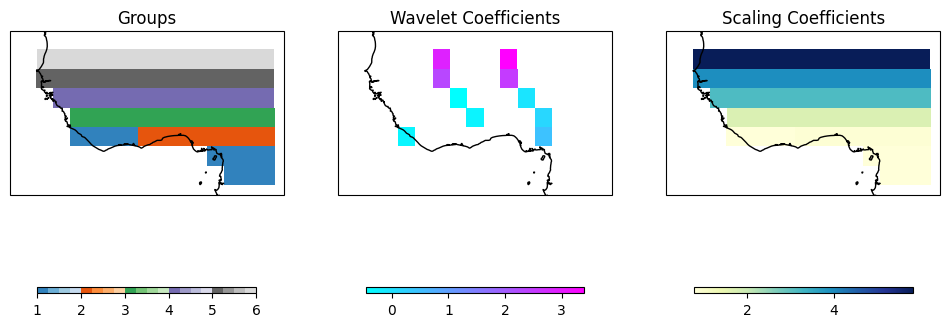

In [97]:
lifted_tas.summary_plot(21, 
                    2, lat_pc, lon_pc, t=0)

## Perform paired grounding

In [ ]:
importlib.reload(joint)
 

pair_ground = joint.pair_ground(lifted_tas,lifted_rh)

grounded_grid_tas, grounded_grid_rh = pair_ground.ground_over_regions([[lifted_tas.C[reg][-1][:,0] for reg in lifted_tas.C.keys()],
                                                                       [lifted_rh.C[reg][-1][:,0] for reg in lifted_rh.C.keys()]],
                                                                      parallel = False, progress = False)



## Visualise results

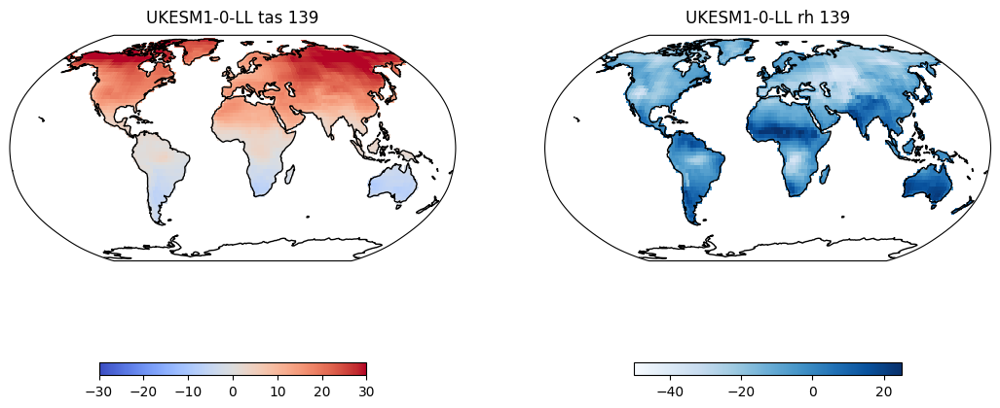

In [16]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

model = 'UKESM1-0-LL'
time_sel = [1970, 1]
dir_key = 'dir_output'
scen = 'historical'
var = 'tas'

dir_est = load_data.get_config()[dir_key]
dir_out_emu = dir_est+model+'/trial_emulations/'


year = np.random.choice(np.arange(337))
emu = np.random.choice(np.arange(100))

y_ma = np.full([72,144],np.nan)
y_ma[idx_l] =  grounded_grid_tas[emu,
           year,:]

fig1=plt.figure(figsize=(13,9))
plt.rcParams.update({'font.size': 10})
plt.rcParams.update({'mathtext.default':'regular'}) 
plt.rcParams.update({'mathtext.default':'it'}) 


ax=fig1.add_subplot(1,2,1,projection=ccrs.Robinson(central_longitude=0))
ax.coastlines()

mesh_1=ax.pcolormesh(
    lon_pc, lat_pc, y_ma,  cmap='coolwarm', transform=ccrs.PlateCarree(), 
    vmin=-30, vmax=30, rasterized=True
                    )

ax.set_title(model+" tas "+str(year),y=1.02,fontsize=12)# 

plt.colorbar(mesh_1, ax = ax, orientation='horizontal', shrink=0.6)


y_ma = np.full([72,144],np.nan)
y_ma[idx_l] =  grounded_grid_rh[emu,
           year,:]

ax=fig1.add_subplot(1,2,2,projection=ccrs.Robinson(central_longitude=0))
ax.coastlines()

mesh_1=ax.pcolormesh(
    lon_pc, lat_pc, y_ma,  cmap='Blues', transform=ccrs.PlateCarree(),
    vmin = -50, vmax=25, rasterized=True
                    )

ax.set_title(model+" rh "+str(year),y=1.02,fontsize=12)# 

plt.colorbar(mesh_1, ax = ax, orientation='horizontal', shrink=0.6)



## Save results also

In [10]:
import joblib

joblib.dump(grounded_grid_tas, 'UKESM1-0-LL/grounded_grid_tas_2.pkl')
joblib.dump(grounded_grid_rh, 'UKESM1-0-LL/grounded_grid_rh_2.pkl')


['UKESM1-0-LL/grounded_grid_rh_2.pkl']

# Draft evaluation code


In [6]:
import joblib

grounded_grid_tas = joblib.load('UKESM1-0-LL/grounded_grid_tas_2.pkl')
grounded_grid_rh = joblib.load('UKESM1-0-LL/grounded_grid_rh_2.pkl')



In [7]:
## First calculate wbgt

def f_calc_wbgt_stull(tas, hurs):
    """ This function calculates the wet bulb temperature (WBT) 
    and wet bulb globe temperature (WBGT) using the Stull approach. 
    Arguments:
              tas : air temperature (C)
              hurs: relative humidity (%)
    Returns:
    wbgt: wet bulb temperature (C)
    wbgt: wet bulb globe temperature (C)"""

    c1 = 0.151977
    c2 = 8.313659
    c3 = 1.676331
    c4 = 0.00391838
    c5 = 0.023101
    c6 = 4.686035

    # Calculate the wet bulb temperature (C):
    wbt_stull = tas * np.arctan(c1 * np.sqrt(hurs + c2)) + np.arctan(tas + hurs) - np.arctan(hurs - c3) + c4 * (hurs**(3/2)) * np.arctan(c5 * hurs)- c6

    # Calculate the wet bulb globe temperature (C):
    wbgt_stull = 0.67* wbt_stull + 0.33 * tas

    # Returns:
    return wbgt_stull

In [14]:
import numpy as np

wbgt = {}
scen = ['ssp585','ssp126','historical']
for model in ['UKESM1-0-LL']:
    
    wbgt[model] = f_calc_wbgt_stull(data_tas[model].sel({'scenario':scen,'run':1}).y.values+(data_tas[model].ref.values[0]-273.15),
                                    data_rh[model].sel({'scenario':scen,'run':1}).y.values+data_rh[model].ref.values[0])

wbgt_emu = f_calc_wbgt_stull(grounded_grid_tas+(data_tas[model].ref.values[0]-273.15),
                                   grounded_grid_rh+data_rh[model].ref.values[0])#



/var/folders/w4/3hrc_6q94rlf15vtszh4mw0r0000gn/T/ipykernel_19150/2366036877.py:21: RuntimeWarning: invalid value encountered in power
  wbt_stull = tas * np.arctan(c1 * np.sqrt(hurs + c2)) + np.arctan(tas + hurs) - np.arctan(hurs - c3) + c4 * (hurs**(3/2)) * np.arctan(c5 * hurs)- c6


In [10]:
wbgt_ref = f_calc_wbgt_stull(data_tas[model].sel({'scenario':'historical','run':1}).y.values+(data_tas[model].ref.values[0]-273.15),
                                    data_rh[model].sel({'scenario':'historical','run':1}).y.values+data_rh[model].ref.values[0])

wbgt_ref= np.mean(wbgt_ref[:600,:], axis=0)

In [15]:
wbgt[model] = np.squeeze(wbgt[model]).reshape(3,-1,12,2652)[:,:,6,:].reshape(-1,2652)
wbgt[model] = (wbgt[model][~np.isnan(wbgt[model])]).reshape(-1,2652)
wbgt[model].shape


(337, 2652)

/Users/shrutinath/.pyenv/versions/tf_2023/lib/python3.12/site-packages/mplotutils/xrcompat.py:13: FutureWarning: It's no longer necessary to compute the edges of the array. This is now done in matplotlib. This function will be removed from mplotutils in a future version.
  warnings.warn(


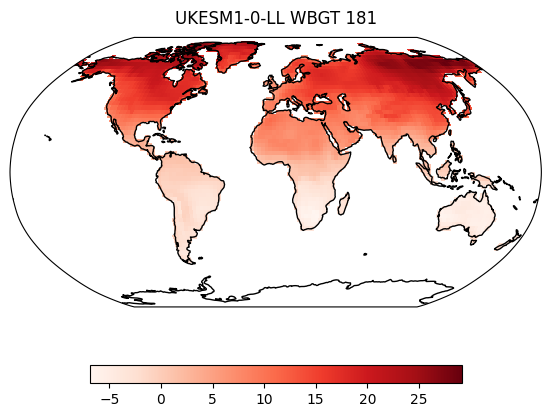

In [18]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import matplotlib.colors as mcolors
import numpy as np

model = 'UKESM1-0-LL'
scen = 'ssp585'
run = 1
timestep = '2050-06-01'

lon_pc, lat_pc, wgt, wgt_l, idx_l = load_data.get_meta_data()

fig1=plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 10})
plt.rcParams.update({'mathtext.default':'regular'}) 
plt.rcParams.update({'mathtext.default':'it'}) 

year = np.random.choice(np.arange(337))
emu = np.random.choice(np.arange(100))

y_ma = np.zeros(idx_l.shape)
y_ma = np.ma.masked_array(y_ma, mask=idx_l==False)
y_ma[idx_l]= wbgt[model][0]

ax=fig1.add_subplot(1,1,1,projection=ccrs.Robinson(central_longitude=0))
ax.coastlines()

mesh_1=ax.pcolormesh(
    lon_pc, lat_pc, y_ma,  cmap='Reds', transform=ccrs.PlateCarree(), 
 rasterized=True
                    )

ax.set_title(model+" WBGT "+str(year),y=1.02,fontsize=12)# 

plt.colorbar(mesh_1, orientation='horizontal', shrink=0.6)


# Making GIFs

/var/folders/w4/3hrc_6q94rlf15vtszh4mw0r0000gn/T/ipykernel_69088/4097397035.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  mesh_1=axemu05.pcolormesh(lon_pc, lat_pc, y_ma,  cmap=plt.cm.get_cmap('coolwarm'),transform=ccrs.PlateCarree(),vmin=-30,vmax=30,rasterized=True)
/var/folders/w4/3hrc_6q94rlf15vtszh4mw0r0000gn/T/ipykernel_69088/4097397035.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  mesh_1=axemu5.pcolormesh(lon_pc, lat_pc, y_ma,  cmap=plt.cm.get_cmap('coolwarm'),transform=ccrs.PlateCarree(),vmin=-30,vmax=30,rasterized=True)
/var/folders/w4/3hrc_6q94rlf15vtszh4mw0r0000gn/T/ipykernel_69088/4097397035.py:56: MatplotlibDeprecationWar

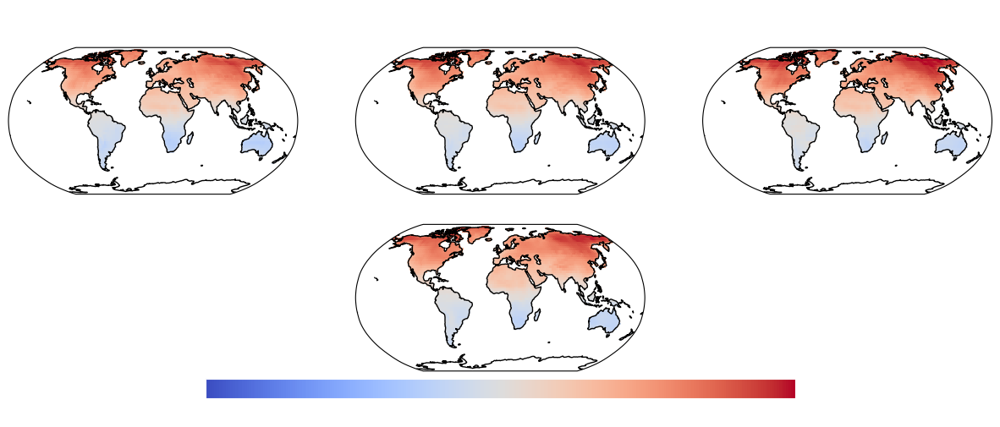

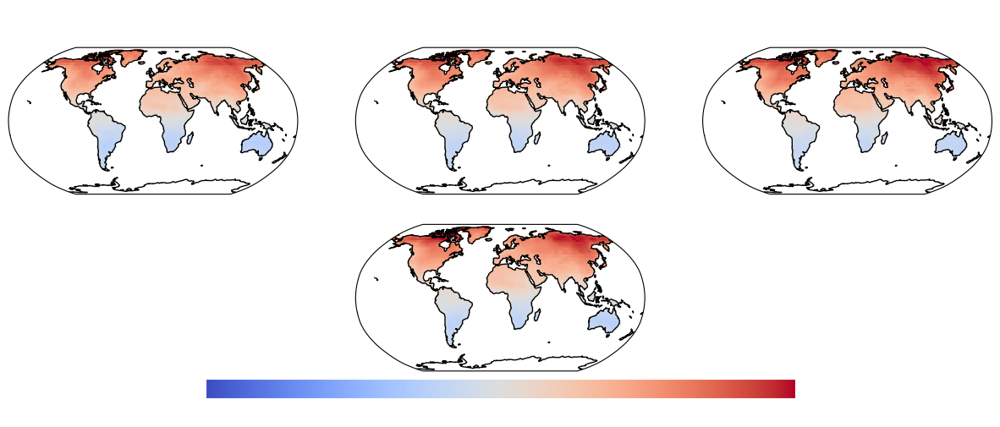

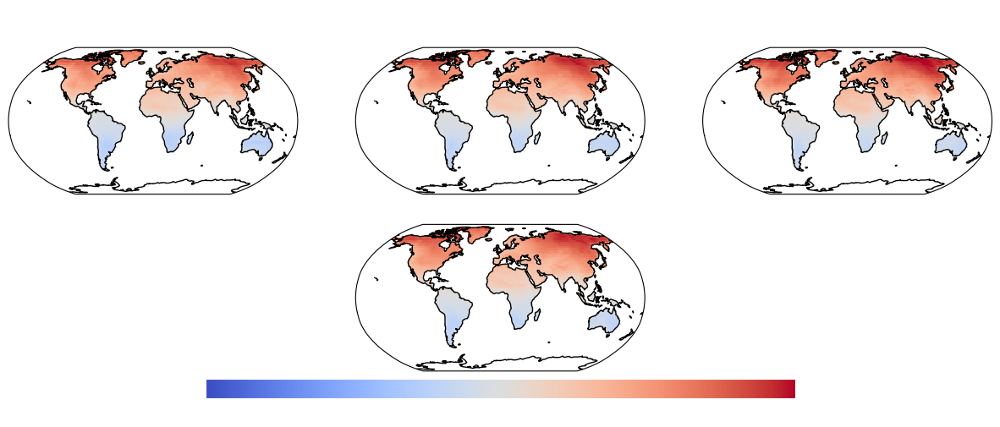

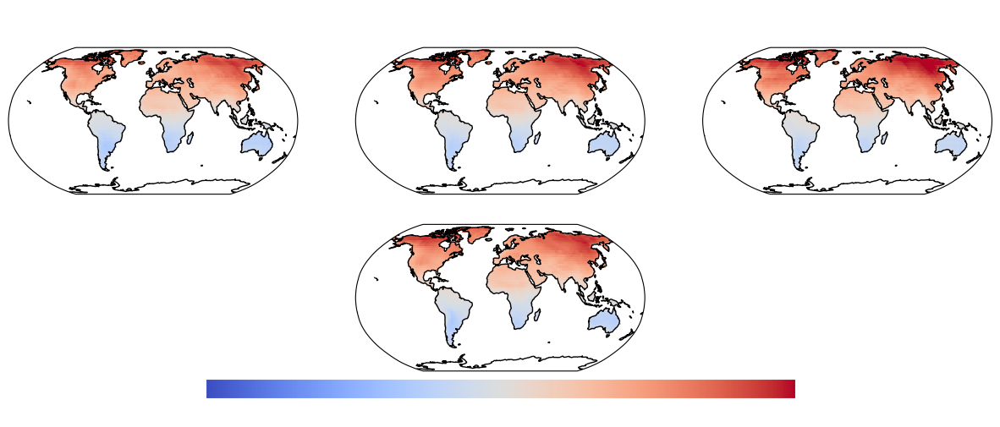

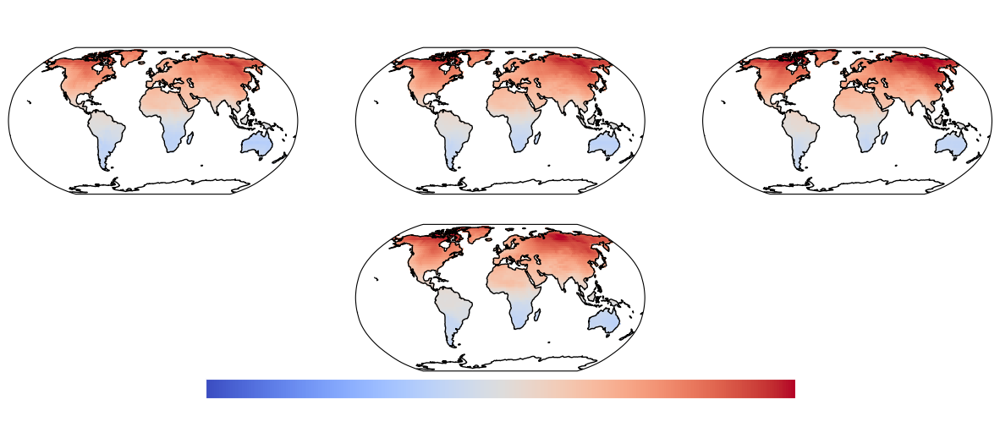

...

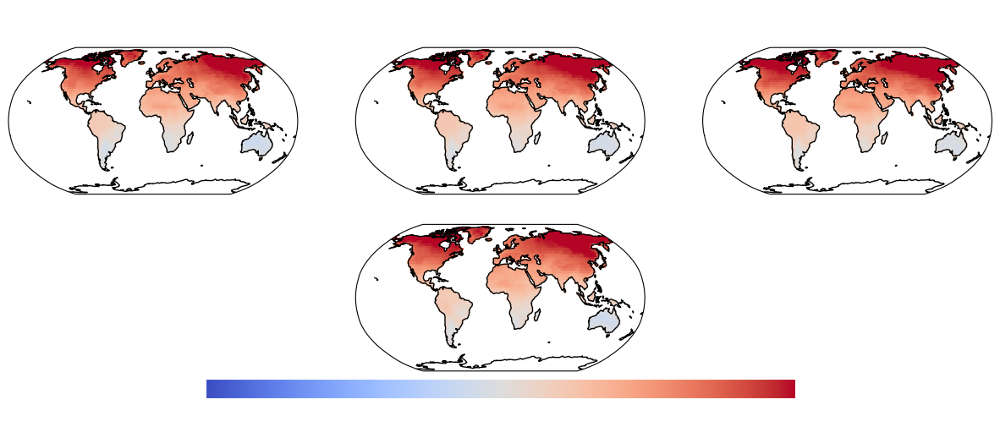

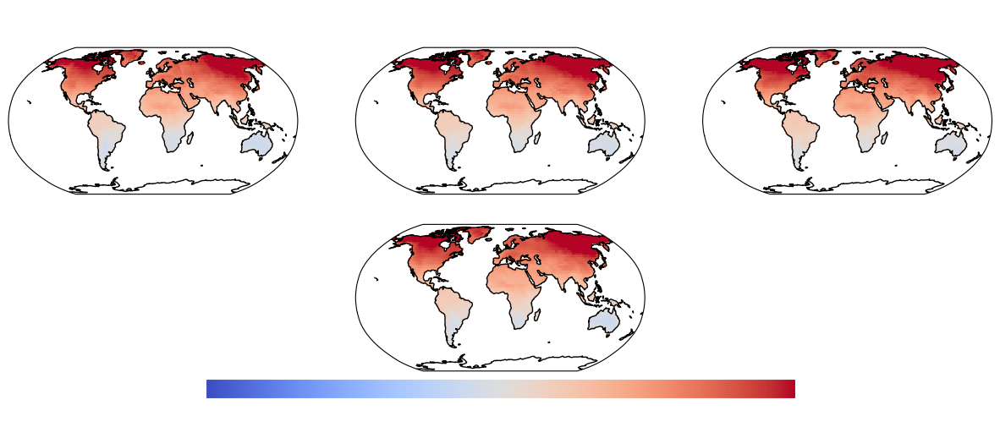

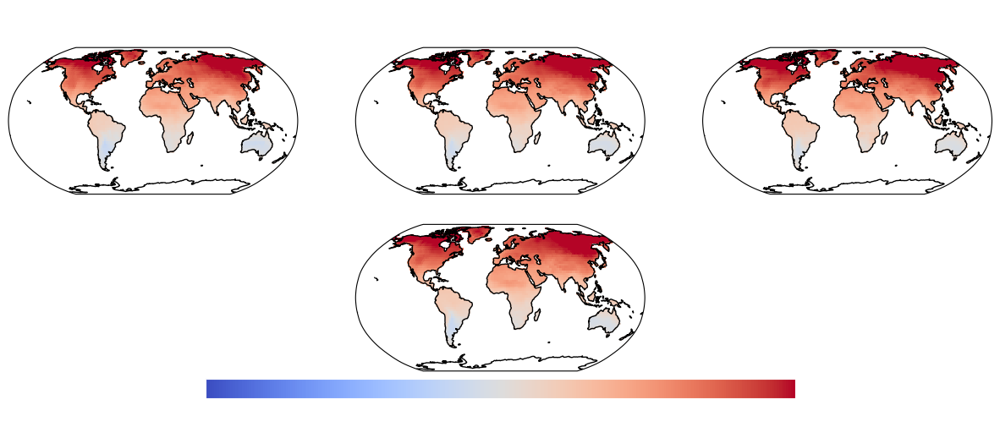

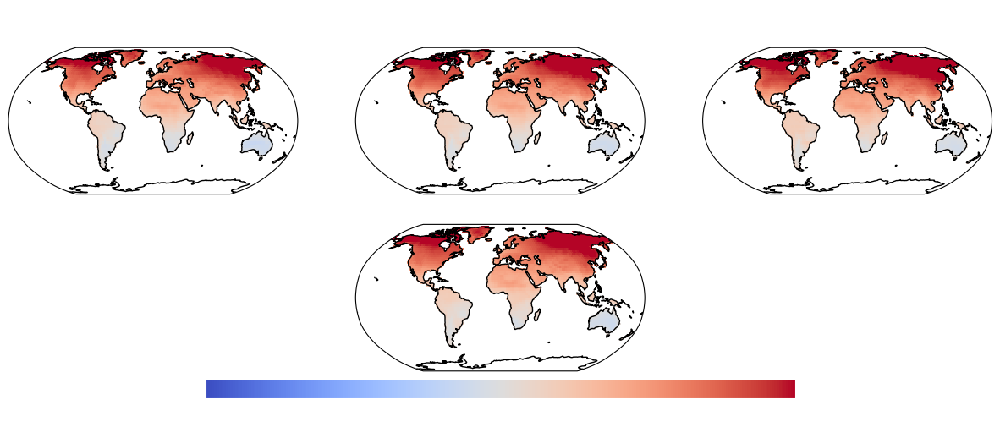

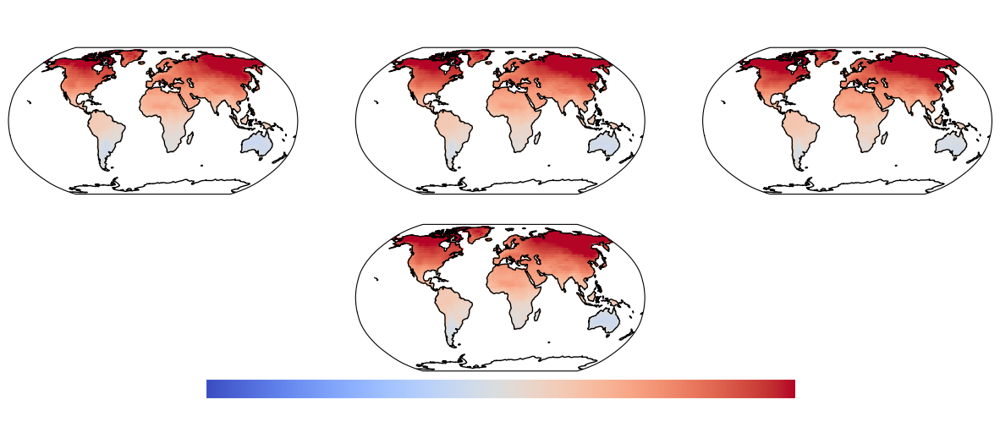

In [186]:
import cartopy.feature as cf
import matplotlib as mpl

model='UKESM1-0-LL'
months=['Jan','Feb','Mar','Apr','May','June','Jul','Aug','Sept','Oct','Nov','Dec']

year_offset=2030-2015

colors = plt.cm.inferno_r(np.linspace(0, 1, 100))[6:]
colors = mpl.colors.LinearSegmentedColormap.from_list('my_colormap', colors)

scen='ssp585'

year_idx = np.arange(86)

for i_mon in [6]:
    

    for i_year in year_idx:
    
        #t_year=np.average(y[model][scen][0,i_year,:], weights=wgt_l)
        
        plt.figure(figsize=(15,6))
        
        
        y_ma = np.zeros(idx_l.shape)
        y_ma = np.ma.masked_array(y_ma, mask=idx_l==False)
        y_ma[idx_l]=np.quantile(wbgt_emu[:,i_year,:],0.05,axis=0)
        
        axemu05=plt.subplot(2,3,1,projection=ccrs.Robinson(central_longitude=0))
        #axemu05.set_extent([22, 52,-5.3, 25], ccrs.PlateCarree())
        axemu05.coastlines()
        #axemu05.add_feature(cf.BORDERS)
        mesh_1=axemu05.pcolormesh(lon_pc, lat_pc, y_ma,  cmap=plt.cm.get_cmap('coolwarm'),transform=ccrs.PlateCarree(),vmin=-30,vmax=30,rasterized=True)
        axemu05.set_title("\n Emulated 5% quantile",y=1.02,fontsize=12,color='white')
        
        y_ma = np.zeros(idx_l.shape)
        y_ma = np.ma.masked_array(y_ma, mask=idx_l==False)
        y_ma[idx_l]=np.quantile(wbgt_emu[:,i_year,:],0.5,axis=0)
        
        axemu5=plt.subplot(2,3,2,projection=ccrs.Robinson(central_longitude=0))
        #axemu5.set_extent([22, 52,-5.3, 25], ccrs.PlateCarree())
        axemu5.coastlines()
        #axemu5.add_feature(cf.BORDERS)
        mesh_1=axemu5.pcolormesh(lon_pc, lat_pc, y_ma,  cmap=plt.cm.get_cmap('coolwarm'),transform=ccrs.PlateCarree(),vmin=-30,vmax=30,rasterized=True)
        axemu5.set_title(r"%i, July"%(2015+i_year)+"\n Emulated 50% quantile",y=1.02,fontsize=12,color='white')
        
        y_ma = np.zeros(idx_l.shape)
        y_ma = np.ma.masked_array(y_ma, mask=idx_l==False)
        y_ma[idx_l]=np.quantile(wbgt_emu[:,i_year,:],0.95,axis=0)
        
        axemu95=plt.subplot(2,3,3,projection=ccrs.Robinson(central_longitude=0))
        #axemu95.set_extent([22, 52,-5.3, 25], ccrs.PlateCarree())
        axemu95.coastlines()
        #axemu95.add_feature(cf.BORDERS)
        mesh_1=axemu95.pcolormesh(lon_pc, lat_pc, y_ma,  cmap=plt.cm.get_cmap('coolwarm'),transform=ccrs.PlateCarree(),vmin=-30,vmax=30,rasterized=True)
        axemu95.set_title("\n Emulated 95% quantile",y=1.02,fontsize=12,color='white')

        y_ma = np.zeros(idx_l.shape)
        y_ma = np.ma.masked_array(y_ma, mask=idx_l==False)
        y_ma[idx_l]=wbgt[model][i_year,:]

        ax=plt.subplot(2,3,5,projection=ccrs.Robinson(central_longitude=0))
        #axemu95.set_extent([22, 52,-5.3, 25], ccrs.PlateCarree())
        ax.coastlines()
        #axemu95.add_feature(cf.BORDERS)
        mesh_1=ax.pcolormesh(lon_pc, lat_pc, y_ma,  cmap=plt.cm.get_cmap('coolwarm'),transform=ccrs.PlateCarree(),vmin=-30,vmax=30,rasterized=True)
        ax.set_title("\n ESM",y=1.02,fontsize=12,color='white')
        
        
        cb=plt.colorbar(mesh_1,ax=plt.gcf().get_axes(),orientation='horizontal', shrink=0.6, aspect=30,pad=0.02)
    

        # set colorbar tick color
        cb.ax.xaxis.set_tick_params(color='white')

        # set colorbar edgecolor 
        cb.outline.set_edgecolor('white')
        plt.setp(plt.getp(cb.ax.axes, 'xticklabels'), color='white')
        
        plt.savefig('UKESM1-0-LL/'+model+'_'+str(i_year)+'_'+months[i_mon]+'GIF_anom_plot.png', dpi=200, facecolor='black')



In [196]:
import imageio
model='UKESM1-0-LL'

images = []

with imageio.get_writer('UKESM1-0-LL/emu_quant_vs_esm_mid_anom.gif', mode='I') as writer:
    for i_year in tqdm(year_idx):
    
        for i_mon in [6]:

            filename ='UKESM1-0-LL/'+model+'_'+str(i_year)+'_'+months[i_mon]+'GIF_anom_plot.png'
            image = imageio.imread(filename)
            images.append(image)
            writer.append_data(image)
        
#gif = imageio.get_reader('UKESM1-0-LL/emu_quant_vs_esm_mid.gif')

imageio.mimsave('UKESM1-0-LL/emu_quant_vs_esm_mid_slow_anom.gif', images, 'GIF', fps=0.9)

  0%|                                                                                  | 0/86 [00:00<?, ?it/s]/var/folders/w4/3hrc_6q94rlf15vtszh4mw0r0000gn/T/ipykernel_69088/2875386284.py:12: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
100%|█████████████████████████████████████████████████████████████████████████| 86/86 [00:04<00:00, 17.32it/s]
